# Electricity load forecasting example
Uses sanitised load data in columnar format by 30 minute interval reading data (kWh)

Has data pipeline that extracts, transforms and integrates CSV dataset into BigQuery relational tables using Pandas. SQL models and views are built for data visualisation:
1. Ingest like for like CSV
2. Transform in Pandas
3. Integrate into BigQuery data lake 'staging-electricity' dataset
4. Create consumption layer (ie SQL views) for BI and analytics in 'DWH_electricity' dataset
5. Use data science and forecasting modelling to predict electricity usage for next 12 months

In [1]:
# Load required libraries
import pandas as pd
from pandasql import sqldf

# Set up SQLalchemy to work with pandas
sql = lambda q: sqldf(q, globals())

# suppress warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Import viz libraries
import matplotlib.pyplot as plt
import plotly
import plotly.offline as py
from scipy.stats import boxcox
from scipy.special import inv_boxcox
from fbprophet.plot import plot_plotly
import plotly.express as px
import plotly.graph_objects as go

# Config plot style sheets
# https://matplotlib.org/3.1.0/gallery/style_sheets/style_sheets_reference.html
plt.style.use('fivethirtyeight')
pd.plotting.register_matplotlib_converters()

In [3]:
# Check files
!ls ../input/*

../input/bom-weather-observation-data-select-stations:
IDCJAC0010_040913_1800_Data.csv  IDCJAC0010_086338_1800_Data.csv
IDCJAC0010_066062_1800_Data.csv

../input/sample-electricity-load-data:
NMIA1.csv  NMIA3.csv  NMIG2.csv  NMIM2.csv  NMIR2.csv  NMIS2.csv  nmi_info.csv
NMIA2.csv  NMIG1.csv  NMIM1.csv  NMIR1.csv  NMIS1.csv  NMIS3.csv


# Extract and ingest load data

In [4]:
import os
import glob

def load_raw_interval_data():
    '''
        Loads interval data from input files.

        Adds in filename as column.

        Assumes:
        1. files are CSV
        2. Each file is named as identifier, plus with two columns (timestamp and interval reading KWH)

        Return
        ------
        filelist of all the files
    '''
    
    # Grabs all the CSV files in the 'directory'
    input_folder = "../input/sample-electricity-load-data"
    csv_filelist = glob.glob(input_folder + "/N*.csv") #Grabs all CSV files that are interval readings
    
    return csv_filelist

In [5]:
# See example of an input file
csv_filelist = load_raw_interval_data()

csv_filelist

['../input/sample-electricity-load-data/NMIG1.csv',
 '../input/sample-electricity-load-data/NMIA2.csv',
 '../input/sample-electricity-load-data/NMIM1.csv',
 '../input/sample-electricity-load-data/NMIS1.csv',
 '../input/sample-electricity-load-data/NMIS2.csv',
 '../input/sample-electricity-load-data/NMIR1.csv',
 '../input/sample-electricity-load-data/NMIG2.csv',
 '../input/sample-electricity-load-data/NMIA3.csv',
 '../input/sample-electricity-load-data/NMIM2.csv',
 '../input/sample-electricity-load-data/NMIR2.csv',
 '../input/sample-electricity-load-data/NMIA1.csv',
 '../input/sample-electricity-load-data/NMIS3.csv']

In [6]:
def conform_filelist(filelist):
    '''
        Takes filelist and conforms

        1. Adds column as date
        2. Changes interval to KWH
        
        Parameters
        ------
        filelist: list
        list of files in local directory

        Return
        ------
        df: Pandas Dataframe
        Dataframe with all the readings
    '''

    # Integrate and conform
    df_output = pd.DataFrame()
    
    for file in filelist:
        df = pd.read_csv(file)
        
        df['NMI'] = os.path.basename(os.path.splitext(file)[0]) #Split off file extension and prefix
        df['AESTTime'] = pd.to_datetime(df['AESTTime']) #Ensure datetime is proper format
        df['Date'] = pd.to_datetime(df['AESTTime'].dt.date) #Add in datetime aggregations.
        
        df.rename(columns={'E':'E_KWH'},inplace=True) # Rename E stream meter data to show its KWH
        
        if df_output is None:
            df_output = df    
        else:
            df_output = df_output.append(df)
    
    return df_output

interval_data = conform_filelist(csv_filelist)

interval_data #Show output

,AESTTime,E_KWH,NMI,Date
0,2017-10-01 00:00:00,80.60,NMIG1,2017-10-01
1,2017-10-01 00:30:00,79.00,NMIG1,2017-10-01
2,2017-10-01 01:00:00,85.60,NMIG1,2017-10-01
3,2017-10-01 01:30:00,85.50,NMIG1,2017-10-01
4,2017-10-01 02:00:00,76.60,NMIG1,2017-10-01
...,...,...,...,...
17515,2018-09-30 21:30:00,13.28,NMIS3,2018-09-30
17516,2018-09-30 22:00:00,14.08,NMIS3,2018-09-30
17517,2018-09-30 22:30:00,13.92,NMIS3,2018-09-30
17518,2018-09-30 23:00:00,14.24,NMIS3,2018-09-30


In [7]:
#Set datetime as pandas datetime to allow filtering by datetime
interval_data['datetime'] = pd.DatetimeIndex(interval_data["AESTTime"])
interval_data.sort_values(['NMI','datetime'], ascending=True, inplace=True)

interval_data.head(10)

,AESTTime,E_KWH,NMI,Date,datetime
0,2017-10-01 00:00:00,7.99,NMIA1,2017-10-01,2017-10-01 00:00:00
1,2017-10-01 00:15:00,7.00,NMIA1,2017-10-01,2017-10-01 00:15:00
2,2017-10-01 00:30:00,8.20,NMIA1,2017-10-01,2017-10-01 00:30:00
3,2017-10-01 00:45:00,8.01,NMIA1,2017-10-01,2017-10-01 00:45:00
4,2017-10-01 01:00:00,9.01,NMIA1,2017-10-01,2017-10-01 01:00:00
5,2017-10-01 01:15:00,8.26,NMIA1,2017-10-01,2017-10-01 01:15:00
6,2017-10-01 01:30:00,8.37,NMIA1,2017-10-01,2017-10-01 01:30:00
7,2017-10-01 01:45:00,8.01,NMIA1,2017-10-01,2017-10-01 01:45:00
8,2017-10-01 02:00:00,8.28,NMIA1,2017-10-01,2017-10-01 02:00:00
9,2017-10-01 02:15:00,8.53,NMIA1,2017-10-01,2017-10-01 02:15:00


In [8]:
# Calculate daily aggregate metrics
daily_interval_data = sql('''
    SELECT 
        NMI
        ,Date
        ,SUM(E_KWH) AS TOTAL_LOAD_KWH
    FROM interval_data 
    GROUP BY 
        NMI,
        Date
''')

# Add in additional metrics
df_std_dev = interval_data.groupby(['NMI', 'Date']).std().rename(columns={'E_KWH': "STD_DEV"})
df_Q4 = interval_data.groupby(['NMI', 'Date']).quantile(1.0).rename(columns={'E_KWH': "Q4"})
df_Q3 = interval_data.groupby(['NMI', 'Date']).quantile(0.75).rename(columns={'E_KWH': "Q3"})
df_Q2 = interval_data.groupby(['NMI', 'Date']).quantile(0.50).rename(columns={'E_KWH': "Q2"})
df_Q1 = interval_data.groupby(['NMI', 'Date']).quantile(0.25).rename(columns={'E_KWH': "Q1"})
df_Q0 = interval_data.groupby(['NMI', 'Date']).quantile(0.0).rename(columns={'E_KWH': "Q0"})

daily_interval_data = sql('''
    SELECT 
        d.NMI
        ,d.Date
        ,d.TOTAL_LOAD_KWH
        ,Q0.Q0 AS MIN_READING_KWH
        ,Q1.Q1 AS Q1_LOAD_KWH
        ,Q2.Q2 AS AVG_LOAD_KWH
        ,Q3.Q3 AS Q3_LOAD_KWH
        ,Q4.Q4 AS MAX_READING_KWH
        ,s.STD_DEV 
    FROM daily_interval_data d
    LEFT JOIN df_Q0 Q0
        ON d.NMI = Q0.NMI
        AND d.Date = Q0.Date
    LEFT JOIN df_Q1 Q1
        ON d.NMI = Q1.NMI
        AND d.Date = Q1.Date
    LEFT JOIN df_Q2 Q2
        ON d.NMI = Q2.NMI
        AND d.Date = Q2.Date    
    LEFT JOIN df_Q3 Q3
        ON d.NMI = Q3.NMI
        AND d.Date = Q3.Date
    LEFT JOIN df_Q4 Q4
        ON d.NMI = Q4.NMI
        AND d.Date = Q4.Date
    LEFT JOIN df_std_dev s
    ON d.NMI = s.NMI
    AND d.Date = s.Date
''')

daily_interval_data.head(10)

,NMI,Date,TOTAL_LOAD_KWH,MIN_READING_KWH,Q1_LOAD_KWH,AVG_LOAD_KWH,Q3_LOAD_KWH,MAX_READING_KWH,STD_DEV
0,NMIA1,2017-10-01 00:00:00.000000,1448.90,7.00,9.6750,17.280,19.4750,22.12,4.775606
1,NMIA1,2017-10-02 00:00:00.000000,1461.82,6.50,9.3275,15.920,19.7050,23.38,5.145462
2,NMIA1,2017-10-03 00:00:00.000000,1526.81,7.42,9.6000,17.840,19.8525,23.95,5.334330
3,NMIA1,2017-10-04 00:00:00.000000,1521.67,7.33,9.1925,17.505,20.6050,25.56,5.767989
4,NMIA1,2017-10-05 00:00:00.000000,1498.03,7.33,9.3200,17.330,19.7750,24.46,5.337268
5,NMIA1,2017-10-06 00:00:00.000000,1454.23,7.41,9.6800,17.220,19.2225,23.71,4.966129
6,NMIA1,2017-10-07 00:00:00.000000,1527.63,7.50,9.4550,17.640,20.6375,28.89,5.722038
7,NMIA1,2017-10-08 00:00:00.000000,1748.55,7.74,10.9325,19.510,23.0825,30.10,6.583794
8,NMIA1,2017-10-09 00:00:00.000000,1525.27,7.40,9.4100,16.180,21.6775,26.48,5.790475
9,NMIA1,2017-10-10 00:00:00.000000,1499.47,7.52,9.7150,17.670,19.8725,24.59,5.163051


# Extract and ingest NMI config data

In [9]:
# Import NMI info as Dimension table
NMI = pd.read_csv('../input/sample-electricity-load-data/nmi_info.csv')

NMI.head()

,Nmi,State,OutInterval
0,NMIM1,QLD,30.0
1,NMIS2,NSW,30.0
2,NMIS3,NSW,30.0
3,NMIA2,VIC,15.0
4,NMIA1,VIC,15.0


# Extract and ingest BOM weather data
Courtesy of http://www.bom.gov.au/climate/data/

In [10]:
# Ingest daily maximum temperature for Sydney, Brisbane and Melbourne
weather_brisbane = pd.read_csv('../input/bom-weather-observation-data-select-stations/IDCJAC0010_040913_1800_Data.csv') # 040913 is Brisbane
weather_sydney = pd.read_csv('../input/bom-weather-observation-data-select-stations/IDCJAC0010_066062_1800_Data.csv') # 066062 is Sydney Observation Hill
weather_melbourne = pd.read_csv('../input/bom-weather-observation-data-select-stations/IDCJAC0010_086338_1800_Data.csv') # 086338 is Melbourne Olympic Park

# show sample
weather_brisbane.head(10)

,Product code,Bureau of Meteorology station number,Year,Month,Day,Maximum temperature (Degree C),Days of accumulation of maximum temperature,Quality
0,IDCJAC0010,40913,1999,1,1,NaN,NaN,NaN
1,IDCJAC0010,40913,1999,1,2,NaN,NaN,NaN
2,IDCJAC0010,40913,1999,1,3,NaN,NaN,NaN
3,IDCJAC0010,40913,1999,1,4,NaN,NaN,NaN
4,IDCJAC0010,40913,1999,1,5,NaN,NaN,NaN
5,IDCJAC0010,40913,1999,1,6,NaN,NaN,NaN
6,IDCJAC0010,40913,1999,1,7,NaN,NaN,NaN
7,IDCJAC0010,40913,1999,1,8,NaN,NaN,NaN
8,IDCJAC0010,40913,1999,1,9,NaN,NaN,NaN
9,IDCJAC0010,40913,1999,1,10,NaN,NaN,NaN


In [11]:
# Identify how many nulls are in dataset
weather_brisbane[weather_brisbane.isna().any(axis=1)]

,Product code,Bureau of Meteorology station number,Year,Month,Day,Maximum temperature (Degree C),Days of accumulation of maximum temperature,Quality
0,IDCJAC0010,40913,1999,1,1,NaN,NaN,NaN
1,IDCJAC0010,40913,1999,1,2,NaN,NaN,NaN
2,IDCJAC0010,40913,1999,1,3,NaN,NaN,NaN
3,IDCJAC0010,40913,1999,1,4,NaN,NaN,NaN
4,IDCJAC0010,40913,1999,1,5,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
7080,IDCJAC0010,40913,2018,5,21,NaN,NaN,NaN
7224,IDCJAC0010,40913,2018,10,12,NaN,NaN,NaN
7238,IDCJAC0010,40913,2018,10,26,NaN,NaN,NaN
7241,IDCJAC0010,40913,2018,10,29,NaN,NaN,NaN


In [12]:
# Transform weather data into one dataset
weather_brisbane['date'] = pd.to_datetime(weather_brisbane[['Year', 'Month', 'Day']])
weather_brisbane['State'] = 'QLD'

weather_melbourne['date'] = pd.to_datetime(weather_melbourne[['Year', 'Month', 'Day']])
weather_melbourne['State'] = 'VIC'

weather_sydney['date'] = pd.to_datetime(weather_sydney[['Year', 'Month', 'Day']])
weather_sydney['State'] = 'NSW'

weather = sql('''
    SELECT 
        date
        ,[Maximum temperature (Degree C)] AS MAX_TEMP_C
        ,State
    FROM weather_brisbane
    UNION
    SELECT 
        date
        ,[Maximum temperature (Degree C)] AS MAX_TEMP_C
        ,State
    FROM weather_sydney
    UNION
    SELECT 
        date
        ,[Maximum temperature (Degree C)] AS MAX_TEMP_C
        ,State
    FROM weather_melbourne
''')

In [13]:
#Set datetime as index to allow filtering by datetime on index
weather['date'] = pd.DatetimeIndex(weather['date'])
weather.sort_values(['State','date'], ascending=True, inplace=True)

weather.head(10)

,date,MAX_TEMP_C,State
0,1859-01-01,24.4,NSW
1,1859-01-02,24.4,NSW
2,1859-01-03,24.2,NSW
3,1859-01-04,24.7,NSW
4,1859-01-05,24.6,NSW
5,1859-01-06,22.2,NSW
6,1859-01-07,24.7,NSW
7,1859-01-08,25.1,NSW
8,1859-01-09,33.9,NSW
9,1859-01-10,27.2,NSW


# Transform and Integrate datasets together to form training data

In [14]:
# Integrate with interval_data and NMI config to form train dataset
train_daily = sql('''
    SELECT
        n.State
        ,d.NMI
        ,d.Date
        ,d.TOTAL_LOAD_KWH
        ,d.MIN_READING_KWH
        ,d.Q1_LOAD_KWH
        ,d.AVG_LOAD_KWH
        ,d.Q3_LOAD_KWH
        ,d.MAX_READING_KWH
        ,d.STD_DEV 
        ,w.MAX_TEMP_C
    FROM daily_interval_data d
    LEFT JOIN NMI n
    ON d.NMI = n.NMI
    LEFT JOIN weather w
    ON d.Date = w.Date
    AND n.State = w.State
''')


# Ensure date is actually date format
train_daily['Date'] = pd.DatetimeIndex(train_daily['Date'])

train_daily.head(10)

,State,NMI,Date,TOTAL_LOAD_KWH,MIN_READING_KWH,Q1_LOAD_KWH,AVG_LOAD_KWH,Q3_LOAD_KWH,MAX_READING_KWH,STD_DEV,MAX_TEMP_C
0,VIC,NMIA1,2017-10-01,1448.90,7.00,9.6750,17.280,19.4750,22.12,4.775606,17.2
1,VIC,NMIA1,2017-10-02,1461.82,6.50,9.3275,15.920,19.7050,23.38,5.145462,16.4
2,VIC,NMIA1,2017-10-03,1526.81,7.42,9.6000,17.840,19.8525,23.95,5.334330,22.3
3,VIC,NMIA1,2017-10-04,1521.67,7.33,9.1925,17.505,20.6050,25.56,5.767989,20.8
4,VIC,NMIA1,2017-10-05,1498.03,7.33,9.3200,17.330,19.7750,24.46,5.337268,19.4
5,VIC,NMIA1,2017-10-06,1454.23,7.41,9.6800,17.220,19.2225,23.71,4.966129,15.0
6,VIC,NMIA1,2017-10-07,1527.63,7.50,9.4550,17.640,20.6375,28.89,5.722038,23.7
7,VIC,NMIA1,2017-10-08,1748.55,7.74,10.9325,19.510,23.0825,30.10,6.583794,25.3
8,VIC,NMIA1,2017-10-09,1525.27,7.40,9.4100,16.180,21.6775,26.48,5.790475,18.7
9,VIC,NMIA1,2017-10-10,1499.47,7.52,9.7150,17.670,19.8725,24.59,5.163051,18.8


# Exploratory Data Analysis

In [15]:
# Some EDA using profiling
import pandas_profiling
train_daily.profile_report(style={'full_width':True})

In [16]:
# Limit visualisation to only 1 NMI
sample_NMI = sql('''
            SELECT 
                AESTTime
                ,E_KWH
            FROM interval_data 
            WHERE 
                NMI = "NMIA1"
                AND AESTTime > "2017-10-01"
                AND AESTTime < "2018-01-31"
            ''')

sample_NMI.sort_values('AESTTime', ascending=True)

# Ensure date is actually date format
sample_NMI['AESTTime'] = pd.DatetimeIndex(sample_NMI['AESTTime'])
sample_NMI.head(5)

,AESTTime,E_KWH
0,2017-10-01 00:00:00,7.99
1,2017-10-01 00:15:00,7.00
2,2017-10-01 00:30:00,8.20
3,2017-10-01 00:45:00,8.01
4,2017-10-01 01:00:00,9.01


In [17]:
# Show interactive plot limited to date range
fig = go.Figure()
fig.add_trace(go.Scatter(x=sample_NMI['AESTTime']
                         ,y=sample_NMI['E_KWH']
                         ,name='4310974060'
                         ,line_color='deepskyblue'
                         )
             )
fig.update_layout(title_text='Interactive - Load Profile'
                  ,xaxis_range=['2017-10-01','2017-12-31']
                  ,xaxis_rangeslider_visible=True)
fig.show()

In [18]:
interval_data.head(5)

,AESTTime,E_KWH,NMI,Date,datetime
0,2017-10-01 00:00:00,7.99,NMIA1,2017-10-01,2017-10-01 00:00:00
1,2017-10-01 00:15:00,7.00,NMIA1,2017-10-01,2017-10-01 00:15:00
2,2017-10-01 00:30:00,8.20,NMIA1,2017-10-01,2017-10-01 00:30:00
3,2017-10-01 00:45:00,8.01,NMIA1,2017-10-01,2017-10-01 00:45:00
4,2017-10-01 01:00:00,9.01,NMIA1,2017-10-01,2017-10-01 01:00:00


In [19]:
# Visualise operating hours using heatmap - show only 1st Quarter to allow seasonality to show 
# Limited to one NMI
fig = go.Figure(data=go.Heatmap(
        z=sql('''
            SELECT 
                E_KWH
            FROM interval_data 
            WHERE 
            NMI = "NMIA1"
            AND AESTTime > "2017-10-01"
            AND AESTTime < "2018-01-31"
            ''')['E_KWH']
        ,y=interval_data['AESTTime'].dt.weekday_name
        ,x=interval_data['AESTTime'].dt.time
        ,xgap = 1
        ,ygap = 1
        #colorscale='Cividis')
        ,colorbar=dict(
            title="WH",
            titleside="top",
            tickmode="array",
            tickvals=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
            )
        )
        ,layout=go.Layout(
            title='Heatmap of Electricity usage - between 1-10-2017 to 31-1-2018'
            ,xaxis_nticks=48
            ,xaxis = dict(tickmode = 'linear')
        )
       )
fig.show()

# Forecast using Prophet and weather as additional auto regressor

In [20]:
# Final Training set
train_daily.head(5)

,State,NMI,Date,TOTAL_LOAD_KWH,MIN_READING_KWH,Q1_LOAD_KWH,AVG_LOAD_KWH,Q3_LOAD_KWH,MAX_READING_KWH,STD_DEV,MAX_TEMP_C
0,VIC,NMIA1,2017-10-01,1448.90,7.00,9.6750,17.280,19.4750,22.12,4.775606,17.2
1,VIC,NMIA1,2017-10-02,1461.82,6.50,9.3275,15.920,19.7050,23.38,5.145462,16.4
2,VIC,NMIA1,2017-10-03,1526.81,7.42,9.6000,17.840,19.8525,23.95,5.334330,22.3
3,VIC,NMIA1,2017-10-04,1521.67,7.33,9.1925,17.505,20.6050,25.56,5.767989,20.8
4,VIC,NMIA1,2017-10-05,1498.03,7.33,9.3200,17.330,19.7750,24.46,5.337268,19.4


In [21]:
# Forecast load going forward for next 365 days
# Forecast will be aggregated - not at NMI level
# Create Prophet model - uses sklearn fit and predict API
from fbprophet import Prophet
m = Prophet()

# Subset - limit to 1 NMI, or 1 state and date range - so can compare actuals vs forecast data
train_daily_subset = sql('''
    SELECT
        Date as ds
        ,TOTAL_LOAD_KWH as y
        ,MAX_TEMP_C
    FROM train_daily
    WHERE
        NMI = 'NMIA1'
        AND State = 'VIC'
''')

# Add weather observation data as regressor
m.add_regressor('MAX_TEMP_C')

# Add country holidays as regressor
m.add_country_holidays(country_name='AU')

m.fit(train_daily_subset)

In [22]:
# Using helper, create next 365 days date range - aggregated to daily basis
# Include weather data
future = m.make_future_dataframe(periods=365, freq='D')
future = sql('''
    SELECT
        f.ds
        ,IFNULL(w.MAX_TEMP_C, 0) AS MAX_TEMP_C
    FROM future f
    LEFT JOIN weather w
    ON f.ds = w.date
    WHERE w.State = 'VIC'
''')
future.tail()

,ds,MAX_TEMP_C
725,2019-09-26 00:00:00.000000,20.3
726,2019-09-27 00:00:00.000000,18.8
727,2019-09-28 00:00:00.000000,14.9
728,2019-09-29 00:00:00.000000,15.8
729,2019-09-30 00:00:00.000000,14.1


In [23]:
# Make prediction using sklearn model - show confidence interval
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
725,2019-09-26,1492.417168,943.178009,2035.521934
726,2019-09-27,1458.885421,934.425031,2002.850337
727,2019-09-28,1372.701780,809.331029,1902.703588
728,2019-09-29,1396.811147,851.259071,1919.744118
729,2019-09-30,1344.641318,798.618933,1878.725792


In [24]:
# Plot interactive plotly viz
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(m, forecast)  # This returns a plotly Figure
py.iplot(fig)

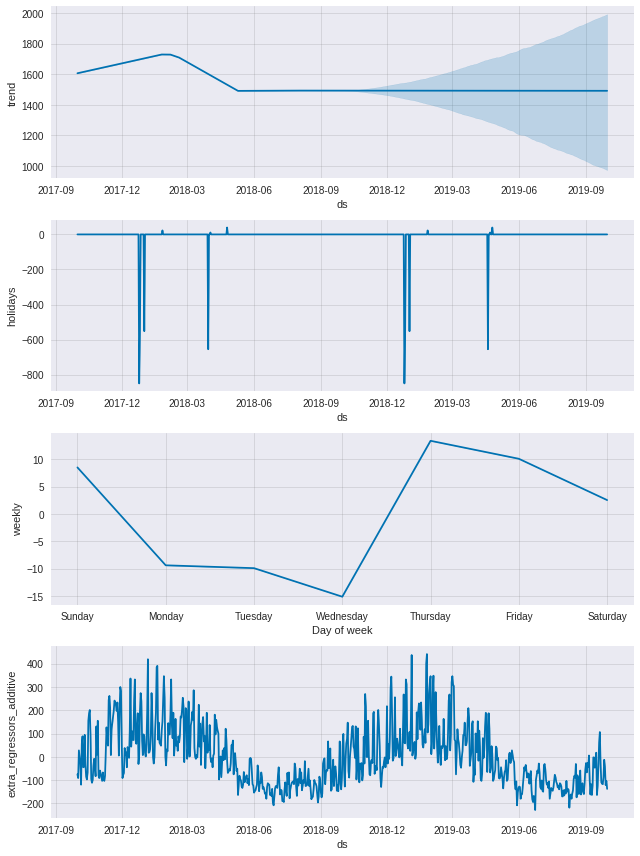

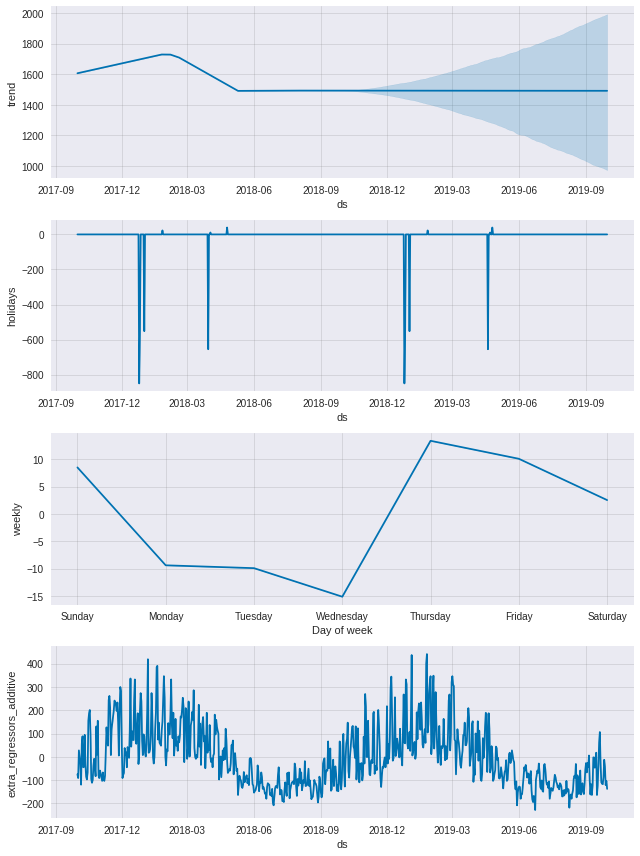

In [25]:
# Plot components of forecast in detail
m.plot_components(forecast)

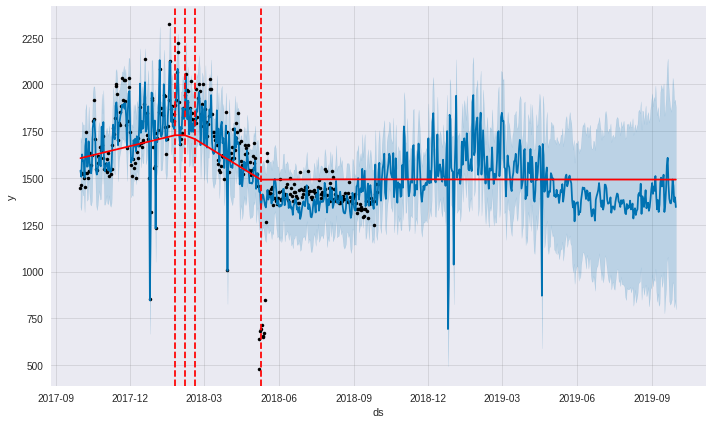

In [26]:
# Show changeplots to see where trends are defined by model
from fbprophet.plot import add_changepoints_to_plot
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

# Observations on forecasting

Seasonality has been correctly identified by the model - it is clear that Victoria's summer peaks in December have highest electricity usage.

Using weather data as regressor has complemented model.

In [27]:
# Cross validation between actuals and forecasted data between cutoff and horizon
from fbprophet.diagnostics import cross_validation
validation = cross_validation(m, initial='0 days', period='365 days', horizon = '180 days')
validation.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2018-04-04,1525.148947,1430.785519,1631.418119,1604.89,2018-04-03
1,2018-04-05,1515.899752,1420.107749,1614.513956,1664.29,2018-04-03
2,2018-04-06,1543.860351,1443.681533,1644.034744,1759.74,2018-04-03
3,2018-04-07,1523.355309,1422.908815,1627.972777,1606.02,2018-04-03
4,2018-04-08,1715.916038,1620.614523,1827.580564,1652.35,2018-04-03


# Integrate transformed data into GCP Bigquery tables

In [28]:
# Test if successful
import pandas_gbq # may require !pip install pandas-gbq
from google.cloud import bigquery
client = bigquery.Client(project='forecastingpoc', location="australia-southeast1")

ModuleNotFoundError: No module named 'pandas_gbq'

In [29]:
# See diagnostics of Prophet
from fbprophet.diagnostics import performance_metrics
performance_metrics(validation)

,horizon,mse,rmse,mae,mape,coverage
0,18 days,26127.663700,161.640539,139.209166,0.082341,0.500000
1,19 days,28178.121072,167.863400,146.335046,0.086549,0.444444
2,20 days,27048.782148,164.465140,140.376068,0.082992,0.500000
3,21 days,25252.999175,158.911923,135.021568,0.080137,0.500000
4,22 days,25719.865086,160.374141,137.286774,0.081729,0.444444
...,...,...,...,...,...,...
158,176 days,415114.062899,644.293460,636.143136,0.473512,0.000000
159,177 days,414908.917357,644.134239,635.970503,0.472263,0.000000
160,178 days,438080.127968,661.876218,652.129275,0.481015,0.000000
161,179 days,469934.978084,685.518036,676.415098,0.496925,0.000000


In [30]:
# Upload dataset to GCP BigQuery
# Interval data
interval_data.to_gbq("staging_electricity.load_interval_data"
                    , project_id='forecastingpoc'
                    , location='australia-southeast1'
                    , if_exists='replace'
                     
# NMI config
NMI.to_gbq("staging_electricity.dim_NMI"
                    , project_id='forecastingpoc'
                    , location='australia-southeast1'
                    , if_exists='replace'
                   )
# Weather data
weather.to_gbq("staging_electricity.weather_observation"
                    , project_id='forecastingpoc'
                    , location='australia-southeast1'
                    , if_exists='replace'
                   )

#Training set
train_daily.to_gbq("staging_electricity.training"
                    , project_id='forecastingpoc'
                    , location='australia-southeast1'
                    , if_exists='replace'
                   )

# Test if successful
from google.cloud import bigquery
client = bigquery.Client(project='forecastingpoc', location="australia-southeast1")

result = client.query('SELECT * FROM `forecastingpoc.staging_electricity.dim_NMI` LIMIT 10')
result.to_dataframe()

SyntaxError: invalid syntax (<ipython-input-30-ee098d2f42e9>, line 9)